# Visualisation Notebook: Diamonds train

## An exploratory analysis

![Image](https://user-images.githubusercontent.com/63467553/88570093-c7aef000-d03b-11ea-8019-8f413cf62cf7.png)

For more info you can visit the following [Github repository](https://github.com/sarrrosa/ih_datamadpt0420_project_m2)


In [1]:
#First, we are importing the libraries needed for the analysis of the diamonds_train-csv database
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from IPython.display import set_matplotlib_formats
import cufflinks as cf
import plotly.graph_objects as go

#Configuration of cufflinks
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [2]:
#Importing the database
diamond_db = pd.read_csv('../data/diamonds_train.csv')

In [3]:
#Exploring our database
diamond_db.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,1.21,Premium,J,VS2,62.4,58.0,4268,6.83,6.79,4.25
1,0.32,Very Good,H,VS2,63.0,57.0,505,4.35,4.38,2.75
2,0.71,Fair,G,VS1,65.5,55.0,2686,5.62,5.53,3.65
3,0.41,Good,D,SI1,63.8,56.0,738,4.68,4.72,3.00
4,1.02,Ideal,G,SI1,60.5,59.0,4882,6.55,6.51,3.95


In [4]:
diamond_db.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40455 entries, 0 to 40454
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    40455 non-null  float64
 1   cut      40455 non-null  object 
 2   color    40455 non-null  object 
 3   clarity  40455 non-null  object 
 4   depth    40455 non-null  float64
 5   table    40455 non-null  float64
 6   price    40455 non-null  int64  
 7   x        40455 non-null  float64
 8   y        40455 non-null  float64
 9   z        40455 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 3.1+ MB


## Challenge 1: Summary statistics

In [5]:
#Max, min, mean, standard deviation, percentiles, correlations
#Data types: Integer, floats, boolean, strings
#Visualisation charts: Box plots, histograms, bar plots, scatter plots, correlation matrix...

In [6]:
#Exploring unique values for cut properties
diamond_db['cut'].unique()

array(['Premium', 'Very Good', 'Fair', 'Good', 'Ideal'], dtype=object)

In [7]:
#Exploring unique values for color properties
diamond_db['color'].unique()

array(['J', 'H', 'G', 'D', 'F', 'E', 'I'], dtype=object)

In [8]:
#Exploring unique values for clarity properties
diamond_db['clarity'].unique()

array(['VS2', 'VS1', 'SI1', 'SI2', 'IF', 'VVS1', 'VVS2', 'I1'],
      dtype=object)

### 1.0. Diamond properties

- **Carat:** It refers to the diamond's weight, not size. The price of a diamond does not increase linearly with the increase of the catat. Carat weight is not related to a better diamond, the cut is. 
- **Cut:** A diamond's cut is crucial to the stone's final beauty and value. It takes into account the design and craftsmanship of the diamond, including its weight relative to its diameter. The most important factor of all the 4Cs.
    - Premium
    - Ideal
    - Very good
    - Good
    - Fair
- **Color:** The color of a diamond is scaled within the GIA color grading system. It defines the colour of the diamond. The most colorless is D and it goes to Z. 
    - D: Colorless
    - E: Colorless
    - F: Colorless
    - G: Near colorless
    - H: Near colorless
    - I: Near colorless
- **Clarity:** Is the assessment of small imperfections on the surface and within the stone. Diamond shape and size affects clarity. 
    - IF: Internally flawless (100% free of inclusions - less than 1% of all diamonds are FL clarity)
    - VVS1, VVS2: Very very slightly included (diamonds have minuscule inclusions that are difficult even for a trained eyes to see under 10x magnification)
    - VS1, VS2: Very slightly included (minor inclusions ranging from difficult (v1) to somewhat easy (v2) to see at 10x magnification)
    - SI2: Slightly included (Inclusions are noticeable at 10x magnification. SI diamonds are often best value)
    - I1: Included (clarity have obvious inclusions that are likely to be visible and impact beauty)
- **Depth:** It is important because the depth of the diamond will affect how much light is reflected back to the observer. *A diamond with an ideal depth will reflect most of the light that comes into the diamond.* The ideal depth would be between 59% and 62,3%
- **Table:** A diamond's table is the flat facet on its surface - As the largest facet on a diamond, the table plays a major role in determining how brilliant (sparkly) the diamond is. A bigger table isn't necessary better. The ideal table would be between 53% and 68%
- **Price:** The total price of the diamond
- **X:** Lenght of the diamond
- **Y:** Width of the diamond
- **Z:** Height of the diamond

### 1.1. Basic statistics

In [9]:
#Exploring max values for the database
diamond_db.max()

carat            4.5
cut        Very Good
color              J
clarity         VVS2
depth             79
table             95
price          18823
x              10.23
y               58.9
z               8.06
dtype: object

In [10]:
#Exploring min values the database
diamond_db.min()

carat       0.2
cut        Fair
color         D
clarity      I1
depth        43
table        43
price       326
x             0
y             0
z             0
dtype: object

In [11]:
#Exploring average values for the database
diamond_db.mean()

carat       0.797706
depth      61.752841
table      57.446133
price    3928.444469
x           5.729392
y           5.732819
z           3.537154
dtype: float64

In [12]:
#Exploring standard deviation for the database
diamond_db.std()

carat       0.475544
depth       1.431725
table       2.233535
price    3992.416147
x           1.124453
y           1.146650
z           0.697062
dtype: float64

In [13]:
#Checking percentiles .25, .50 and .75
diamond_db.quantile(.25)

carat      0.40
depth     61.00
table     56.00
price    945.00
x          4.71
y          4.72
z          2.91
Name: 0.25, dtype: float64

In [14]:
diamond_db.quantile(.50)

carat       0.70
depth      61.80
table      57.00
price    2397.00
x           5.69
y           5.71
z           3.52
Name: 0.5, dtype: float64

In [15]:
diamond_db.quantile(.75)

carat       1.040
depth      62.500
table      59.000
price    5331.000
x           6.540
y           6.540
z           4.035
Name: 0.75, dtype: float64

In [16]:
#Checking if there are any 0 or null values within the df
len(diamond_db[(diamond_db['x']==0)])

5

In [17]:
len(diamond_db[(diamond_db['y']==0)])

4

In [18]:
len(diamond_db[(diamond_db['z']==0)])

16

In [19]:
#Dropping the 0 values
diamond_db.loc[(diamond_db['x']==0) | (diamond_db['y']==0) | (diamond_db['z']==0)]

,carat,cut,color,clarity,depth,table,price,x,y,z
1606,1.01,Premium,F,SI2,59.2,58.0,3837,6.50,6.47,0.0
3945,2.02,Premium,H,VS2,62.7,53.0,18207,8.02,7.95,0.0
6465,0.71,Good,F,SI2,64.1,60.0,2130,0.00,0.00,0.0
13839,2.80,Good,G,SI2,63.8,58.0,18788,8.90,8.85,0.0
14815,1.07,Ideal,F,SI2,61.6,56.0,4954,0.00,6.62,0.0
14891,2.18,Premium,H,SI2,59.4,61.0,12631,8.49,8.45,0.0
16425,2.20,Premium,H,SI1,61.2,59.0,17265,8.42,8.37,0.0
19856,1.00,Premium,G,SI2,59.1,59.0,3142,6.55,6.48,0.0
21602,1.15,Ideal,G,VS2,59.2,56.0,5564,6.88,6.83,0.0
24795,1.10,Premium,G,SI2,63.0,59.0,3696,6.50,6.47,0.0


In [20]:
diamond_db = diamond_db[(diamond_db[['x', 'y', 'z']] != 0).all (axis=1)]

In [21]:
diamond_db.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40439 entries, 0 to 40454
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    40439 non-null  float64
 1   cut      40439 non-null  object 
 2   color    40439 non-null  object 
 3   clarity  40439 non-null  object 
 4   depth    40439 non-null  float64
 5   table    40439 non-null  float64
 6   price    40439 non-null  int64  
 7   x        40439 non-null  float64
 8   y        40439 non-null  float64
 9   z        40439 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 3.4+ MB


In [22]:
diamond_db.describe()

,carat,depth,table,price,x,y,z
count,40439.000000,40439.000000,40439.000000,40439.000000,40439.000000,40439.000000,40439.000000
mean,0.797425,61.753013,57.445543,3926.535448,5.729616,5.732897,3.538553
std,0.475257,1.431306,2.233055,3990.024501,1.122384,1.145002,0.693639
min,0.200000,43.000000,43.000000,326.000000,3.770000,3.720000,1.070000
25%,0.400000,61.000000,56.000000,945.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2396.000000,5.690000,5.710000,3.520000
75%,1.040000,62.500000,59.000000,5329.500000,6.540000,6.540000,4.040000
max,4.500000,79.000000,95.000000,18823.000000,10.230000,58.900000,8.060000


### 1.2. Visualisation charts

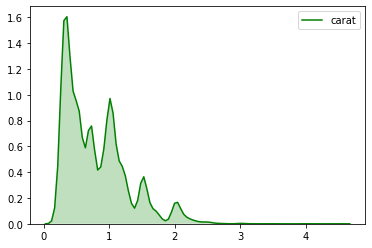

In [23]:
#Distribution of carats
sns.kdeplot(diamond_db['carat'],shade=True, color='g')

In [24]:
fig = diamond_db['cut'].value_counts()
fig.iplot(kind='bar',barmode='stack', color='blue', title='Distribution of diamond cut', yTitle='Cut')

In [36]:
diamond_db[['cut', 'price']].pivot(columns='cut', values='price').iplot(kind='box')

In [25]:
fig = diamond_db['color'].value_counts()
fig.iplot(kind='bar',barmode='stack', color='darkred', title='Distribution of diamond color', yTitle='Color')

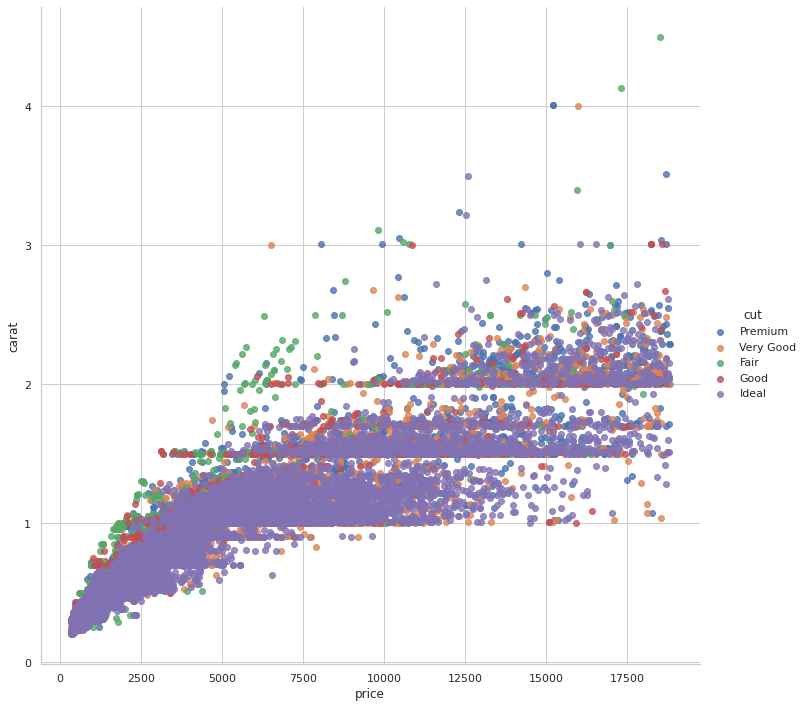

In [35]:
sns.lmplot(y='carat', x='price', hue='cut', data= diamond_db, fit_reg= False, size=10)

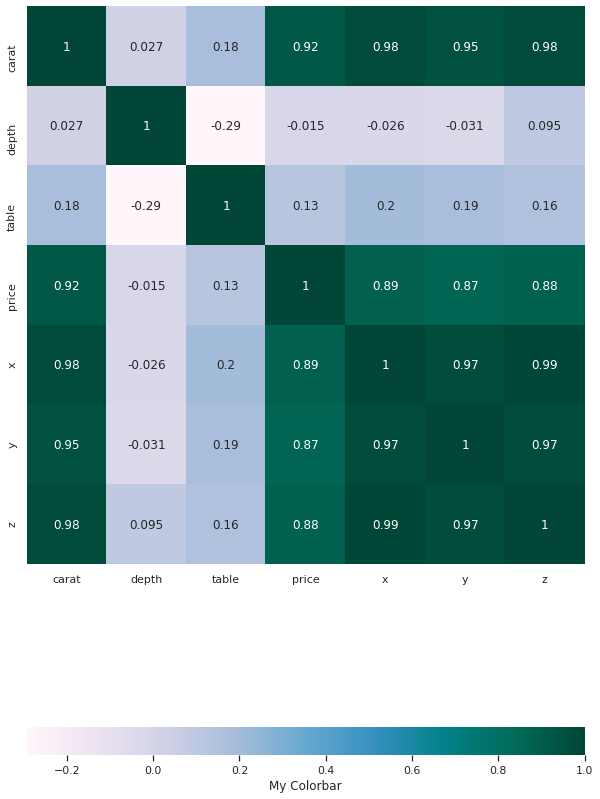

In [27]:
#Correlation analysis
correlation = diamond_db.corr()
plt.figure(figsize=(10, 20))
sns.set(font_scale=1)
sns.heatmap(data=correlation, square=True, annot=True, cbar=True, cmap="PuBuGn", cbar_kws={'label': 'My Colorbar', 'orientation': 'horizontal'})

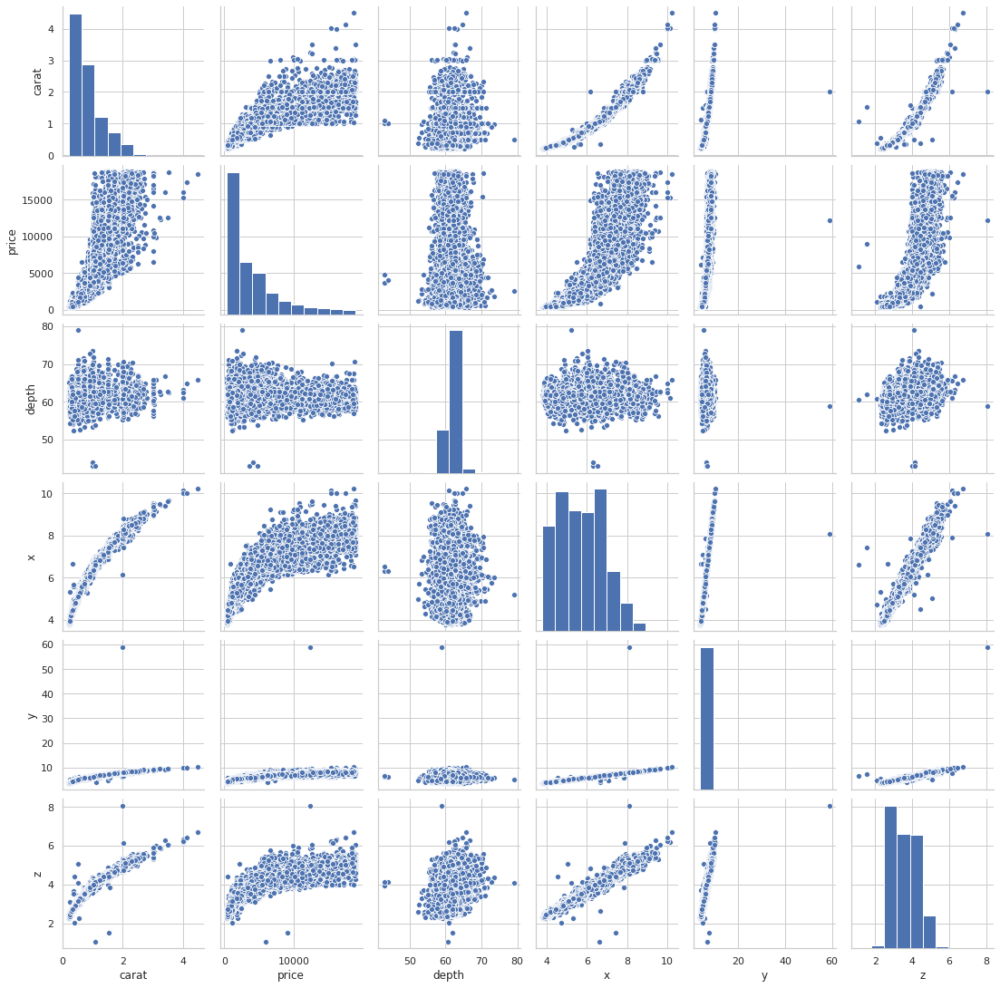

In [28]:
sns.set_style('whitegrid') 
sns.pairplot(diamond_db, vars = ['carat', 'price','depth', 'x', 'y', 'z'], palette='coolwarm')

In [29]:
hist_fig = px.histogram(x=diamond_db['clarity'], nbins=10, title='Distribution of clarity values',
                   labels={'x':'Clarity values'})
hist_fig.show()

In [30]:
fig = px.box(diamond_db, x="color", y="price")
fig.show()

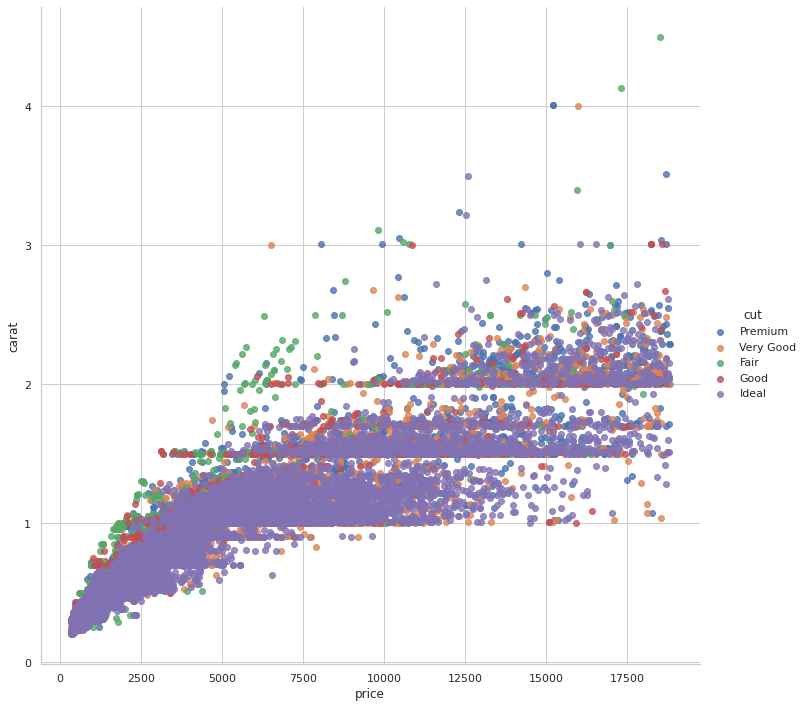

In [31]:
sns.lmplot(y="carat", x="price", hue="cut", data= diamond_db, fit_reg= False, size=10)

(2.0, 10.0)

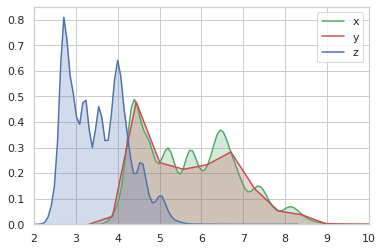

In [32]:
sns.kdeplot(diamond_db['x'],shade=True, color='g')
sns.kdeplot(diamond_db['y'], shade=True, color='r')
sns.kdeplot(diamond_db['z'], shade= True, color='b')
plt.xlim(2,10)

In [33]:
diamond_db[['clarity', 'price']].pivot(columns='clarity', values='price').iplot(kind='box')

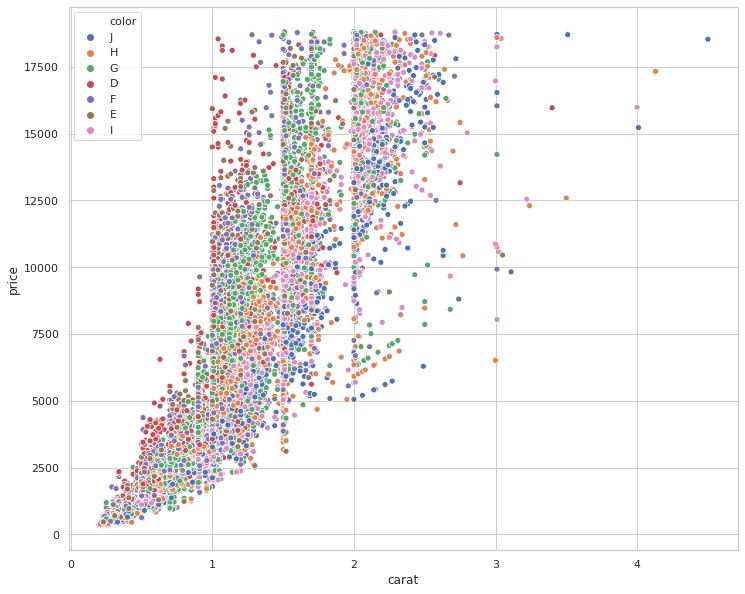

In [40]:
plt.figure(figsize=(12,10))
sns.scatterplot(data=diamond_db, x="carat", y="price", hue="color")

## Summary


### After carefully analysing the dataset provided, we can conclude the following assumptions:

1. There is a strong correlation in the price-carat result. Obviously in broad knowledge assumption carats are the most marketer term used for diamond standards, thus, probably they're being used in this sense in order to setting the price, however, after researching, cut is actually the most important factor of all 4Cs. 

2. In all variables, the prices of the diamonds reach the maximum level. Meaning, you need to choose carefully the diamond values as you can fall into a increased price discrimination in terms of the diamond quality. 

3. According to the research, the cut is the most important factor of all 4Cs, however, most of the ideal cuts fall within 1 - 1,5 carat value.

### Recommendations for a potential buyer:

Analyse other factors apart from the carats, it might be worth to try finding a diamond with an Ideal cut, falling within 1 and 1.5 carats and D or E colors. 